In [1]:
import os
import sys
import ztffields
import numpy as np
import pandas as pd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

from astropy.table import Table, vstack
from astropy.io import ascii

sys.path.append('/Users/adamboesky/Research/long_transients/Source_Analysis')
sys.path.append('/Users/adamboesky/Research/long_transients')

from filter_fields import combine_stats, create_filter_flowchart
from Extracting.utils import get_n_quadrants_merged_all_fields
from Extracting.Catalogs import get_ztf_metadata_from_coords, ztf_image_exists, get_ztf_metadata_from_metadata
from Source_Analysis.Sources import Sources, Source

/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Look at the sky footprint that we have extracted on

In [25]:
# Get all fields 15 arcseconds from the galactic plane
good_fields = ztffields.get_fieldid(galb_range=[[-90,-15], [15,90]], grid="main")

# Get a df for the fields, and add ccdids + qids
FIELDS = ztffields.Fields()
# Field poly is shape (fields, ccds, quadrants, quad_corners)
field_df, field_polys = FIELDS.get_field_vertices(good_fields, level='quadrant', steps=2)
field_df['ccdid'] = field_df['rcid'] // 4
field_df['qid'] = field_df['rcid'] % 4
field_df.head()

,fieldid,rcid,ccdid,qid
0,1,0,0,0
1,1,1,0,1
2,1,2,0,2
3,1,3,0,3
4,1,4,1,0


In [ ]:
# Check which fields have deep images
imaged_fields = []
for fieldid in np.unique(field_df['fieldid']):
    if ztf_image_exists({'fieldid': fieldid}, verbose=0):
        imaged_fields.append(fieldid)

In [ ]:
# Save off array
np.save('/Users/adamboesky/Research/long_transients/Data/imaged_fields.npy', imaged_fields)

In [26]:
# Load array
imaged_fields = np.load('/Users/adamboesky/Research/long_transients/Data/imaged_fields.npy')

In [27]:
# Cut the field df down to those which have been images
field_df = field_df[np.isin(field_df['fieldid'], imaged_fields)]
field_df

,fieldid,rcid,ccdid,qid
8768,202,0,0,0
8769,202,1,0,1
8770,202,2,0,2
8771,202,3,0,3
8772,202,4,1,0
...,...,...,...,...
41659,877,59,14,3
41660,877,60,15,0
41661,877,61,15,1
41662,877,62,15,2


/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/ztffields/plotting.py:879: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches = [Polygon(**fieldvert_.to_dict(), **kwargs) for i, fieldvert_ in fieldverts.iterrows()]


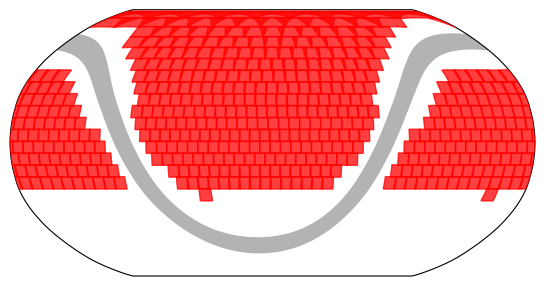

In [29]:
# Plot the fields
ztffields.skyplot_fields(imaged_fields, alpha=0.75, color='red', projection=ccrs.Robinson())
plt.show()

In [ ]:
# Get the total area that our extraction covers
n_quadrants_all_fields = get_n_quadrants_merged_all_fields()
print(n_quadrants_all_fields)
total_deg_covered = 0
for field in imaged_fields:
    total_deg_covered += 0.73 * np.max([n_quadrants_all_fields[field]['g'], n_quadrants_all_fields[field]['r'], n_quadrants_all_fields[field]['i']])
print(f'{total_deg_covered} deg^2')

{'000502': {'g': 43, 'r': 41, 'i': 42}, '000499': {'g': 10, 'r': 10, 'i': 9}, '000806': {'g': 3, 'r': 3, 'i': 1}, '000512': {'g': 4, 'r': 4, 'i': 4}, '000500': {'g': 46, 'r': 46, 'i': 44}, '000503': {'g': 5, 'r': 5, 'i': 4}, '000513': {'g': 2, 'r': 2, 'i': 2}, '000501': {'g': 47, 'r': 45, 'i': 44}, '000511': {'g': 3, 'r': 3, 'i': 0}}
118.99 deg^2


# Loading and combining field results into singular files

In [16]:
# Combine the graphs of all the fields
stat_dfs = {0: [], 1: [], 2: []}
g_tabs = {0: [], 1: [], 2: []}
r_tabs = {0: [], 1: [], 2: []}
i_tabs = {0: [], 1: [], 2: []}
g_wide_tabs = {0: [], 1: [], 2: []}
r_wide_tabs = {0: [], 1: [], 2: []}
i_wide_tabs = {0: [], 1: [], 2: []}

filter_dir = '/Users/adamboesky/Research/long_transients/Data/filter_results'
for field_dirname in os.listdir(filter_dir):
    if field_dirname == 'combined':
        continue

    for cat_num in stat_dfs.keys():
        df = pd.read_csv(os.path.join(filter_dir, field_dirname, f'{cat_num}_filter_stats.csv'))
        df.loc[pd.isnull(df['branch']), 'branch'] = ''
        stat_dfs[cat_num].append(df)

        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_g.ecsv')):
            g_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_g.ecsv')))
        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_r.ecsv')):
            r_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_r.ecsv')))
        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_i.ecsv')):
            i_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_i.ecsv')))

        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_g.ecsv')):
            g_wide_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_g.ecsv')))
        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_r.ecsv')):
            r_wide_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_r.ecsv')))
        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_i.ecsv')):
            i_wide_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_i.ecsv')))


combined_stats = {}
combined_g_tabs = {}
combined_r_tabs = {}
combined_i_tabs = {}
combined_g_wide_tabs = {}
combined_r_wide_tabs = {}
combined_i_wide_tabs = {}

empty_table = Table(names=g_tabs[0][0].colnames, dtype=[col.dtype for col in g_tabs[0][0].columns.values()])

for cat_num in stat_dfs.keys():
    combined_stats[cat_num] = combine_stats(stat_dfs[cat_num])
    
    # TODO: temporary for bad pstarr extraction
    if cat_num != 2:
        combined_g_tabs[cat_num] = vstack(g_tabs[cat_num])
        combined_r_tabs[cat_num] = vstack(r_tabs[cat_num])
        combined_i_tabs[cat_num] = vstack(i_tabs[cat_num])

        combined_g_wide_tabs[cat_num] = empty_table.copy() if len(g_wide_tabs[cat_num]) == 0 else vstack(g_wide_tabs[cat_num])
        combined_r_wide_tabs[cat_num] = empty_table.copy() if len(r_wide_tabs[cat_num]) == 0 else vstack(r_wide_tabs[cat_num])
        combined_i_wide_tabs[cat_num] = empty_table.copy() if len(i_wide_tabs[cat_num]) == 0 else vstack(i_wide_tabs[cat_num])

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_67773/4247915007.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[pd.isnull(df['branch']), 'branch'] = ''
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_67773/4247915007.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[pd.isnull(df['branch']), 'branch'] = ''
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_67773/4247915007.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype 

In [17]:
# Create flowcharts and save
for cat_num, stats_df in combined_stats.items():
    fchart = create_filter_flowchart(stats_df)
    fchart.save(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_combined.pdf')

    if cat_num != 2:
        combined_g_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_g.ecsv', overwrite=True)
        combined_r_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_r.ecsv', overwrite=True)
        combined_i_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_i.ecsv', overwrite=True)

        combined_g_wide_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_wide_g.ecsv', overwrite=True)
        combined_r_wide_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_wide_r.ecsv', overwrite=True)
        combined_i_wide_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_wide_i.ecsv', overwrite=True)

In [6]:
field_000806_r = ascii.read('/Users/adamboesky/Research/long_transients/Data/catalog_results/field_results/000806_r.ecsv')
field_000806_r

ra,dec,ZTF_thresh,ZTF_npix,ZTF_tnpix,ZTF_xmin,ZTF_xmax,ZTF_ymin,ZTF_ymax,ZTF_x,ZTF_y,ZTF_x2,ZTF_y2,ZTF_xy,ZTF_errx2,ZTF_erry2,ZTF_errxy,ZTF_a,ZTF_b,ZTF_theta,ZTF_cxx,ZTF_cyy,ZTF_cxy,ZTF_cflux,ZTF_flux,ZTF_cpeak,ZTF_peak,ZTF_xcpeak,ZTF_ycpeak,ZTF_xpeak,ZTF_ypeak,ZTF_sepExtractionFlag,ZTF_KronRad,ZTF_rKronMag,ZTF_rKronMagErr,ZTF_rKronCircleFlag,ZTF_rKronFlag,ZTF_rPSFMag,ZTF_rPSFMagErr,ZTF_rPSFFlags,ZTF_qfit,ZTF_cfit,ZTF_r_zero_pt_mag,ZTF_r_mag_limit,ZTF_ra,ZTF_dec,PSTARR_PanSTARR_ID,PSTARR_gKronMag,PSTARR_gKronMagErr,PSTARR_gApMag,PSTARR_gApMagErr,PSTARR_gPSFMag,PSTARR_gPSFMagErr,PSTARR_gpsfLikelihood,PSTARR_ginfoFlag2,PSTARR_primaryDetection,PSTARR_rKronMag,PSTARR_rKronMagErr,PSTARR_rApMag,PSTARR_rApMagErr,PSTARR_rPSFMag,PSTARR_rPSFMagErr,PSTARR_rpsfLikelihood,PSTARR_rinfoFlag2,PSTARR_ra,PSTARR_dec,association_separation_arcsec,Catalog,Catalog_Flag,x,y,PSTARR_iKronMag,PSTARR_iKronMagErr,PSTARR_iApMag,PSTARR_iApMagErr,PSTARR_iPSFMag,PSTARR_iPSFMagErr,PSTARR_ipsfLikelihood,PSTARR_iinfoFlag2
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str6,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
12.382945478227892,60.0091884245353,1.4756803512573242,9.0,1.0,279.0,281.0,109.0,111.0,280.0,110.0,0.5,0.5,0.0,0.0002938814183012707,0.00029388141830127075,0.0,0.7071067690849304,0.7071067690849304,0.7853981852531433,2.0,2.0,-0.0,212.3258056640625,212.3258056640625,53.081451416015625,212.3258056640625,280.0,110.0,280.0,110.0,0.0,0.058339339269035284,16.735825827909146,0.0019925420245643895,1.0,32.0,nan,nan,nan,nan,nan,26.275,22.3978996,12.382886264358516,60.0091606205229,1.8001012382893184e+17,19.72480010986328,0.0178459994494915,19.663000106811523,0.0029639999847859144,19.580400466918945,0.012378999963402748,-0.5168619751930237,0.0,1.0,18.896299362182617,0.007656000088900328,18.776399612426758,0.0019509999547153711,18.809600830078125,0.006000999826937914,0.44098201394081116,0.0,12.38300469209727,60.00921622854771,0.29238975449113846,Both,0,280.0,110.0,--,--,--,--,--,--,--,--
12.680742766110622,59.995254525219195,1.4756803512573242,23.0,7.0,815.0,821.0,110.0,113.0,818.4944585998866,111.19997348800852,1.0437466282333272,0.6588506596093118,0.0003177262477969123,7.474824645063701e-05,2.8539377758228123e-05,-2.9260002690049056e-06,1.021639347076416,0.8116959929466248,0.0008254852727986872,0.9580870866775513,1.5177948474884033,-0.0009240619256161153,1437.188232421875,1441.376953125,217.83306884765625,476.646484375,819.0,111.0,818.0,111.0,0.0,0.8958158323769241,16.461423250286803,0.001529789928228941,1.0,32.0,nan,nan,nan,nan,nan,26.275,22.3978996,12.680746872990824,59.99518960915549,1.799901268077751e+17,18.532899856567383,0.004939999897032976,18.452199935913086,0.0016969999996945262,18.473600387573242,0.004352000076323748,0.9068729877471924,128.0,1.0,17.762300491333008,0.0045079998672008514,17.665199279785156,0.0011699999449774623,17.662599563598633,0.0039369999431073666,-0.23238299787044525,128.0,12.680738659230423,59.9953194412829,0.4676295049122999,Both,0,818.4944585998866,111.19997348800852,--,--,--,--,--,--,--,--
13.0552394493711,59.977014379755616,1.4756803512573242,18.0,4.0,1494.0,1498.0,110.0,113.0,1496.004786245283,111.46754046138983,0.8404178931599597,0.7486448121489779,0.16871749612460007,0.00021985383846229457,0.00014161098109182393,4.123699499367549e-05,0.9845696687698364,0.7872008681297302,0.6526234149932861,1.24626886844635,1.3990435600280762,-0.5617279410362244,566.298095703125,565.9566650390625,90.57986450195312,207.

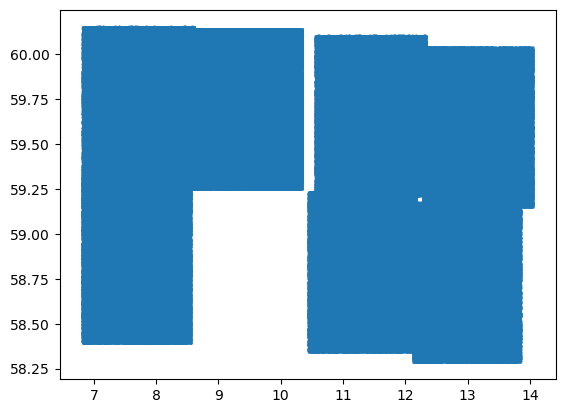

In [7]:
plt.scatter(field_000806_r['PSTARR_ra'], field_000806_r['PSTARR_dec'], s=1, alpha=0.5)

# Examining candidates

## Detected in both

In [16]:
srcs = Sources(
    ras=combined_g_tabs[0]['ra'],
    decs=combined_g_tabs[0]['dec'],
    field_catalogs={
        'g': combined_g_tabs[0],
        'r': combined_r_tabs[0],
        'i': combined_i_tabs[0],
    }
)

In [22]:
srcs[0].data[['ZTF_gPSFMag', 'ZTF_gPSFMagErr', 'ZTF_gKronMag', 'ZTF_gKronMagErr']]

ZTF_gPSFMag,ZTF_gPSFMagErr,ZTF_gKronMag,ZTF_gKronMagErr
float64,float64,float64,float64
19.94641636316274,0.006332905604863812,18.139469068394945,0.01095305998980577


<SkyCoord (ICRS): (ra, dec) in deg
    (90.55715423, 13.52732014)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>90.11270978053484+AND+ra<91.00159868053485+AND+dec>13.082875693592912+AND+dec<13.971764593592914+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>90.11270978053484+AND+ra<91.00159868053485+AND+dec>13.082875693592912+AND+dec<13.971764593592914+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>90.11270978053484+AND+ra<91.00159868053485+AND+dec>13.082875693592912+AND+dec<13.971764593592914+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpb4gbddyi/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpb4gbddyi/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwl

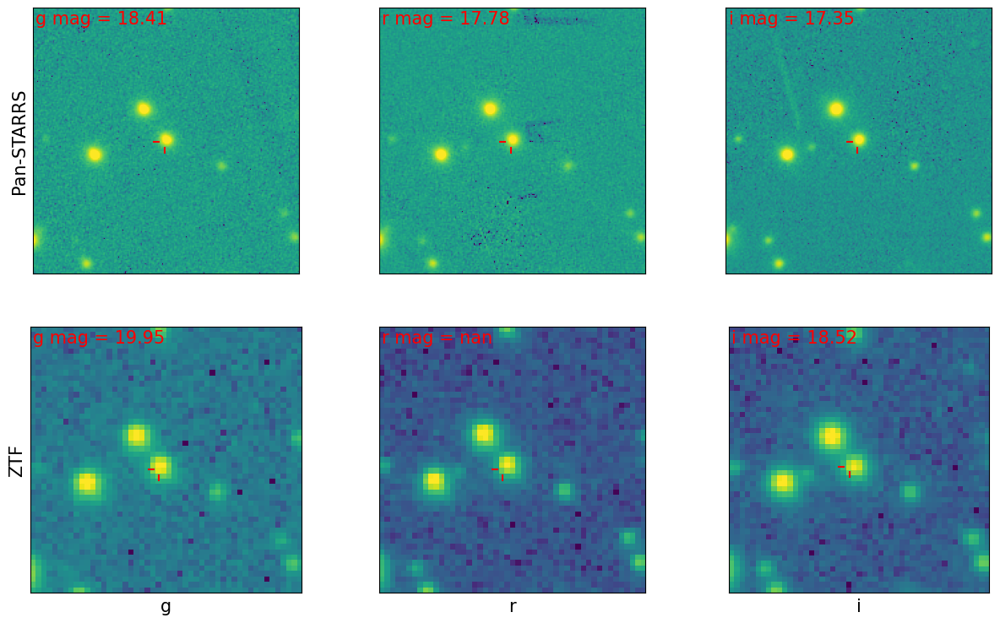

<SkyCoord (ICRS): (ra, dec) in deg
    (90.11800975, 13.44217256)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.67356529719395+AND+ra<90.56245419719396+AND+dec>12.997728114360621+AND+dec<13.886617014360622+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.67356529719395+AND+ra<90.56245419719396+AND+dec>12.997728114360621+AND+dec<13.886617014360622+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.67356529719395+AND+ra<90.56245419719396+AND+dec>12.997728114360621+AND+dec<13.886617014360622+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpeq_68yfn/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpeq_68yfn/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwl

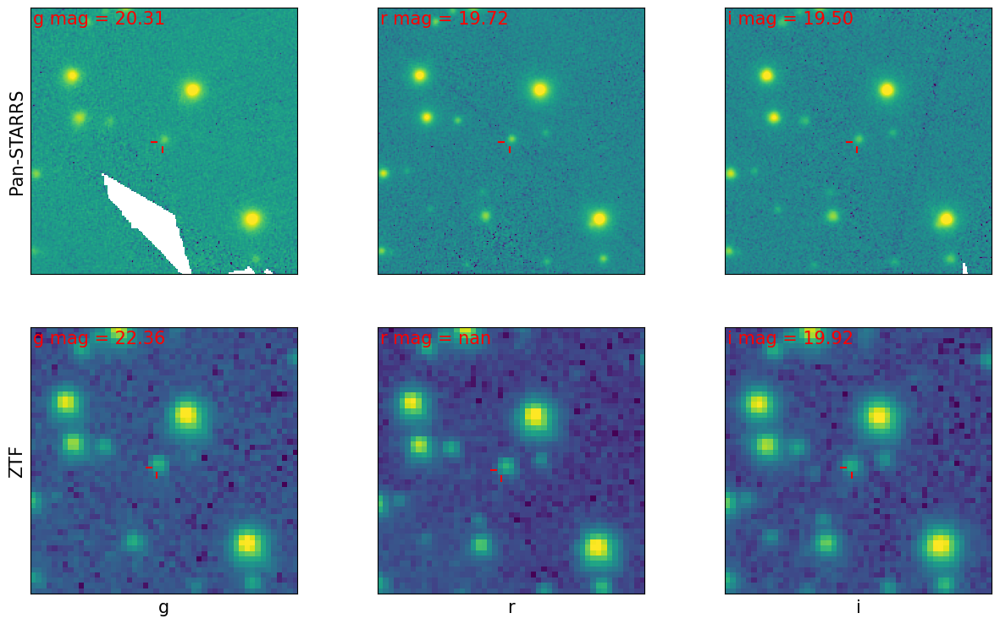

<SkyCoord (ICRS): (ra, dec) in deg
    (90.52610682, 13.39031411)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>90.08166237138398+AND+ra<90.970551271384+AND+dec>12.945869662561408+AND+dec<13.83475856256141+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>90.08166237138398+AND+ra<90.970551271384+AND+dec>12.945869662561408+AND+dec<13.83475856256141+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>90.08166237138398+AND+ra<90.970551271384+AND+dec>12.945869662561408+AND+dec<13.83475856256141+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpcsb1byrm/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpcsb1byrm/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc

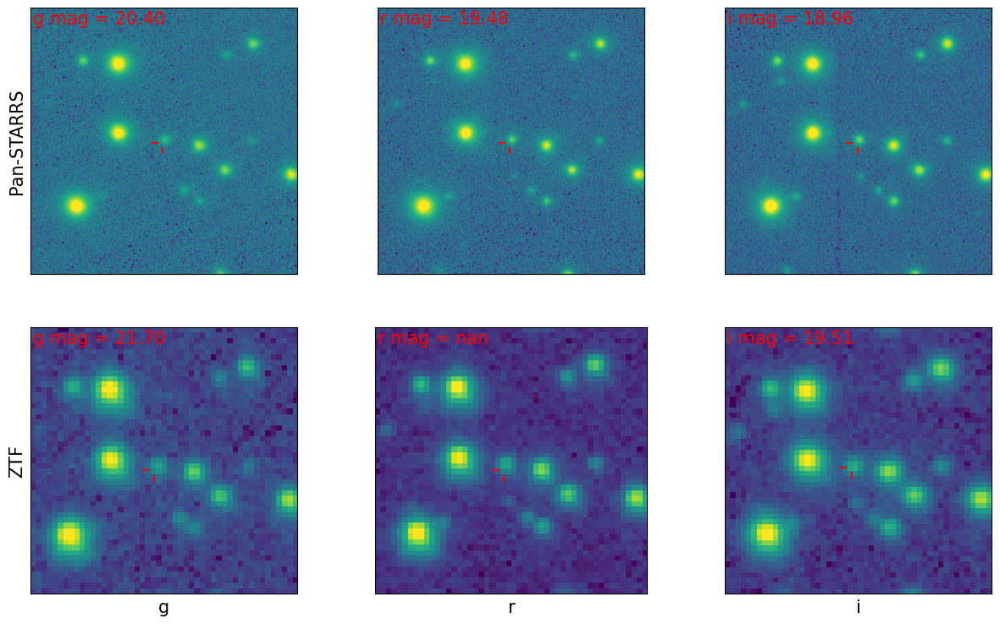

<SkyCoord (ICRS): (ra, dec) in deg
    (89.85118863, 13.36198734)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.40674418305373+AND+ra<90.29563308305374+AND+dec>12.917542894808435+AND+dec<13.806431794808436+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.40674418305373+AND+ra<90.29563308305374+AND+dec>12.917542894808435+AND+dec<13.806431794808436+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.40674418305373+AND+ra<90.29563308305374+AND+dec>12.917542894808435+AND+dec<13.806431794808436+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpn5oinzp1/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpn5oinzp1/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwl

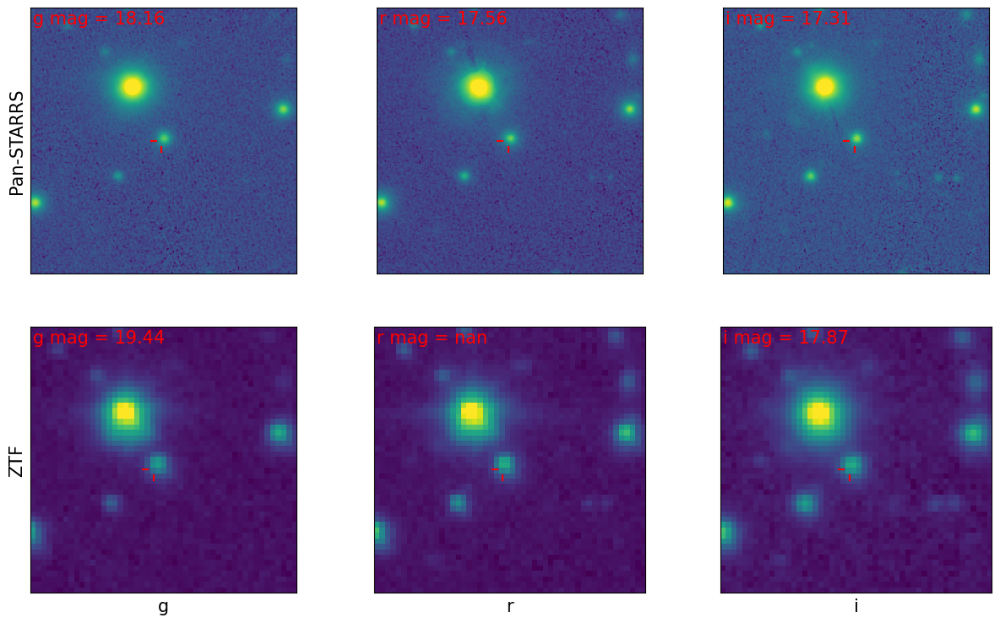

<SkyCoord (ICRS): (ra, dec) in deg
    (90.35469372, 13.30802645)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.91024926847167+AND+ra<90.79913816847169+AND+dec>12.863581999147323+AND+dec<13.752470899147324+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.91024926847167+AND+ra<90.79913816847169+AND+dec>12.863581999147323+AND+dec<13.752470899147324+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.91024926847167+AND+ra<90.79913816847169+AND+dec>12.863581999147323+AND+dec<13.752470899147324+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpsr9dmn7y/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpsr9dmn7y/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwl

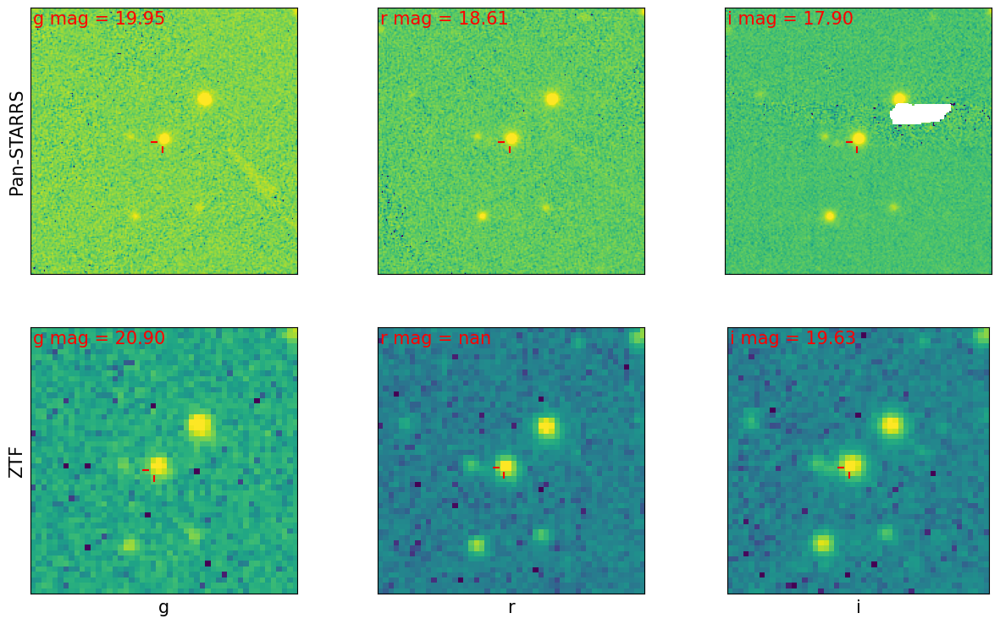

In [7]:
for src in srcs[:5]:
    print(src.coord)
    src.plot_all_cutouts()
    plt.show()

## Detected in just ZTF

In [8]:
srcs_ztf = Sources(
    ras=combined_g_tabs[1]['ra'],
    decs=combined_g_tabs[1]['dec'],
    field_catalogs={
        'g': combined_g_tabs[1],
        'r': combined_r_tabs[1],
        'i': combined_i_tabs[1],
    }
)

<SkyCoord (ICRS): (ra, dec) in deg
    (96.68776819, 12.7401831)>


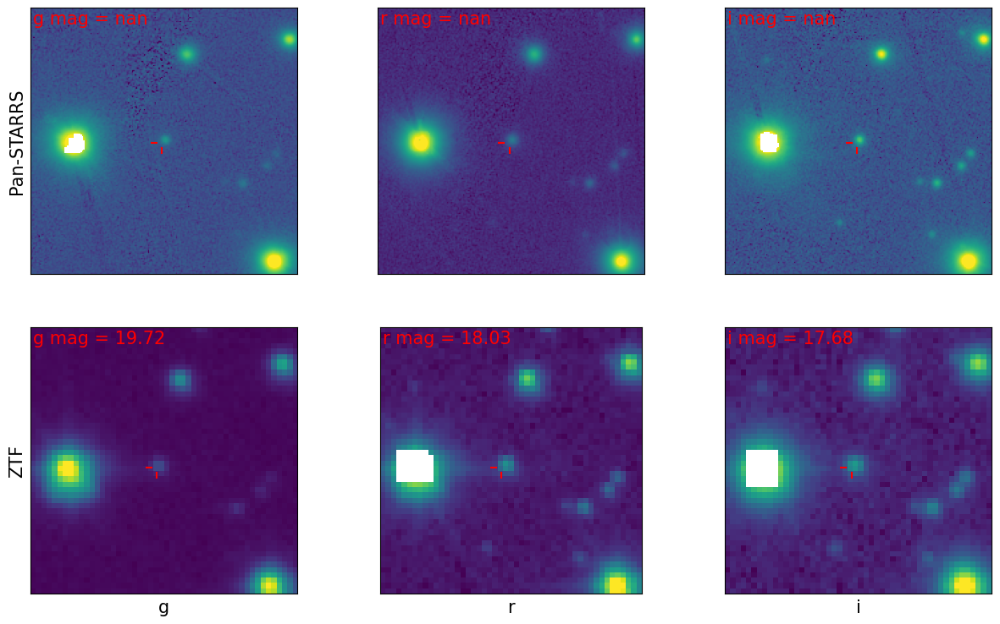

<SkyCoord (ICRS): (ra, dec) in deg
    (9.96913769, 59.24900693)>
object of type 'NoneType' has no len()
Skipping...
object of type 'NoneType' has no len()
Skipping...
object of type 'NoneType' has no len()
Skipping...


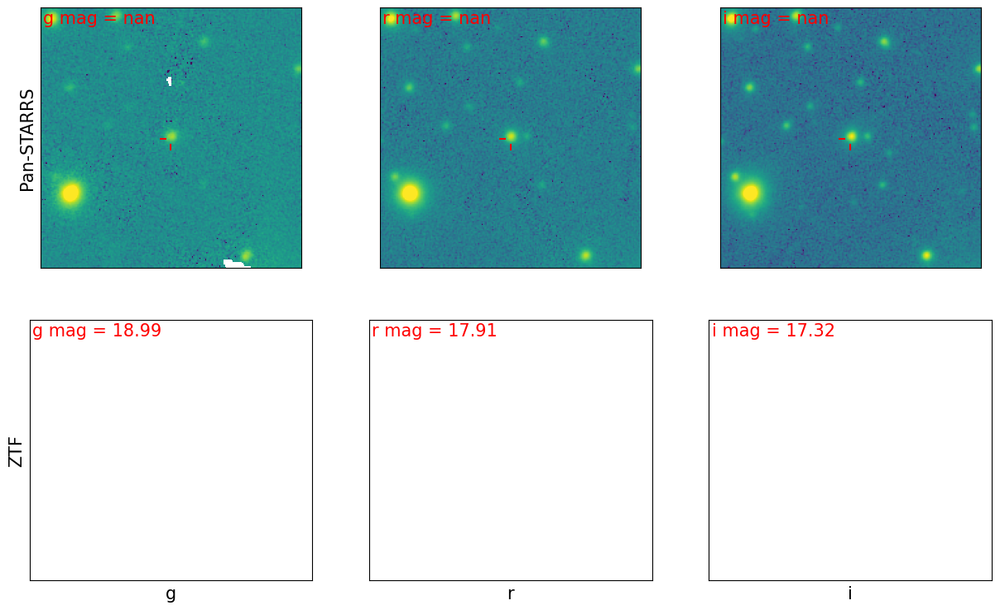

<SkyCoord (ICRS): (ra, dec) in deg
    (88.39892801, 12.41782208)>
'i'
Skipping...


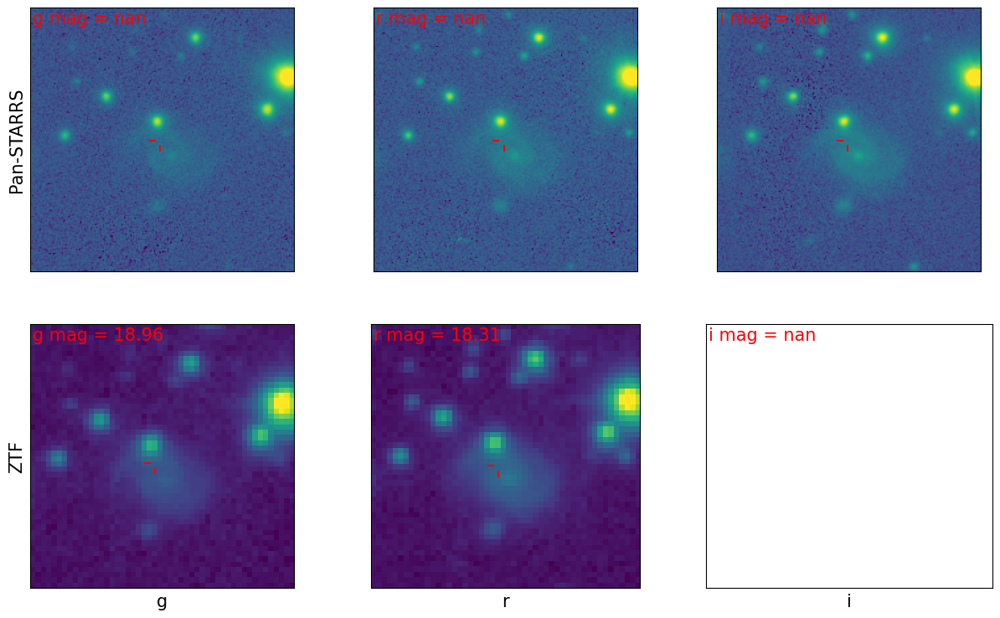

<SkyCoord (ICRS): (ra, dec) in deg
    (2.95104436, 9.13973202)>


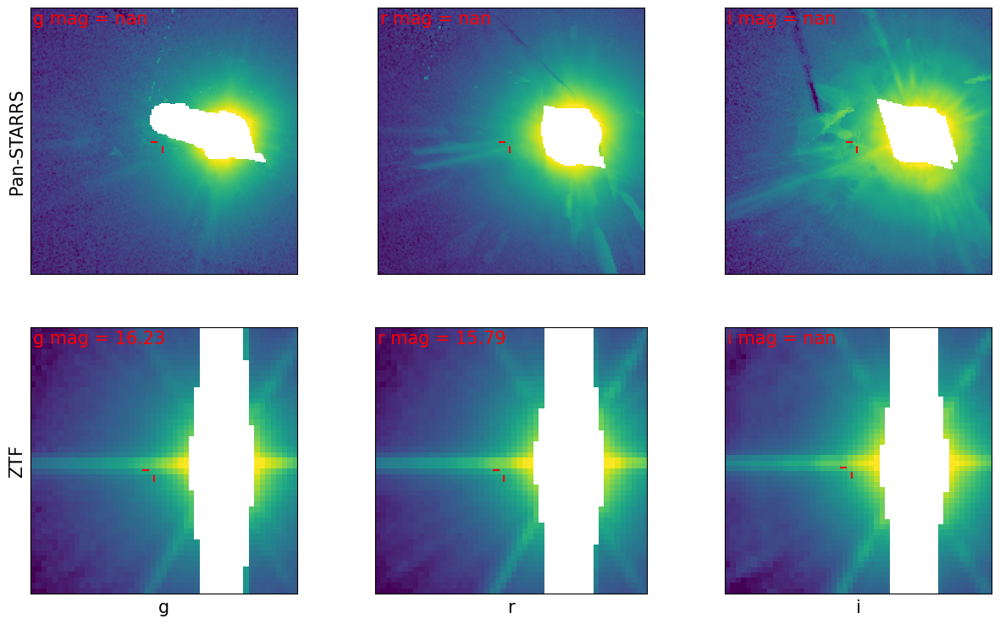

<SkyCoord (ICRS): (ra, dec) in deg
    (5.08979672, 9.3680965)>
index -1 is out of bounds for axis 0 with size 0
Skipping...


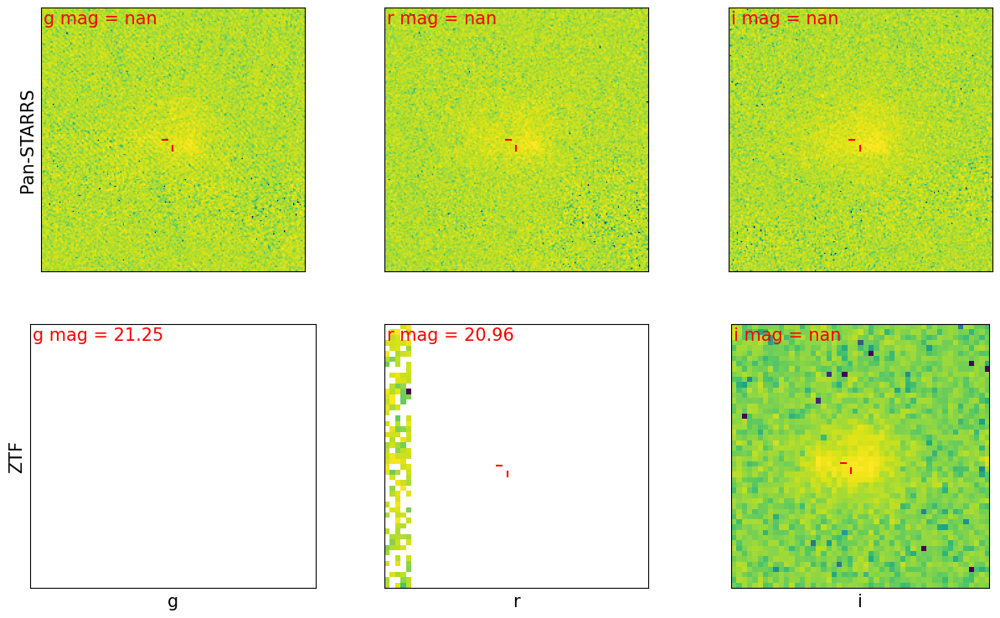

<SkyCoord (ICRS): (ra, dec) in deg
    (4.84632814, 9.04397059)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.401883686042263+AND+ra<5.290772586042262+AND+dec>8.599526141910907+AND+dec<9.488415041910908+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.401883686042263+AND+ra<5.290772586042262+AND+dec>8.599526141910907+AND+dec<9.488415041910908+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.401883686042263+AND+ra<5.290772586042262+AND+dec>8.599526141910907+AND+dec<9.488415041910908+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmppk27tusk/ztf_000499_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmppk27tusk/ztf_000499_zr_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3s

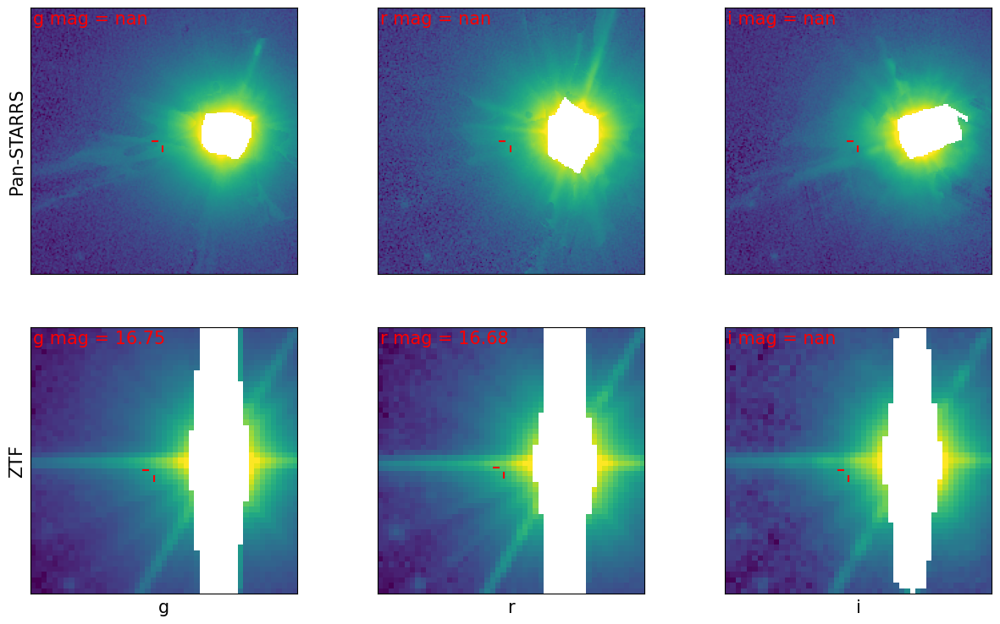

<SkyCoord (ICRS): (ra, dec) in deg
    (4.13610585, 8.24061708)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>3.691661396030794+AND+ra<4.580550296030793+AND+dec>7.796172634209484+AND+dec<8.685061534209485+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>3.691661396030794+AND+ra<4.580550296030793+AND+dec>7.796172634209484+AND+dec<8.685061534209485+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>3.691661396030794+AND+ra<4.580550296030793+AND+dec>7.796172634209484+AND+dec<8.685061534209485+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp4gp2muoh/ztf_000499_zg_c01_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp4gp2muoh/ztf_000499_zr_c01_q3_refimg.fits
No i images found for the specified RA and DEC.
'i'
Skipping...
Searc

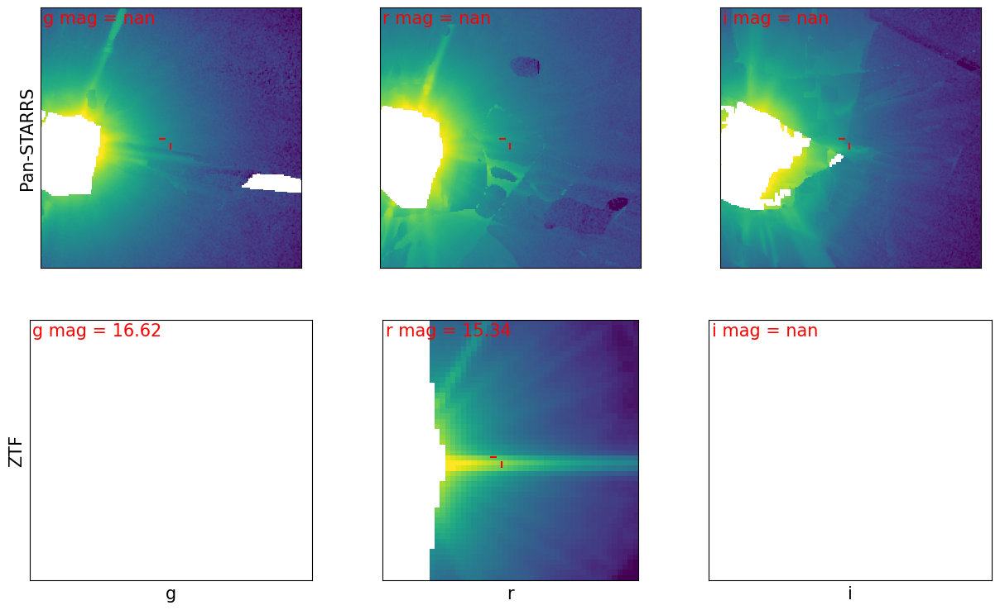

<SkyCoord (ICRS): (ra, dec) in deg
    (1.53031758, 9.71474458)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>1.0858731343212464+AND+ra<1.9747620343212464+AND+dec>9.270300133249089+AND+dec<10.15918903324909+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>1.0858731343212464+AND+ra<1.9747620343212464+AND+dec>9.270300133249089+AND+dec<10.15918903324909+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>1.0858731343212464+AND+ra<1.9747620343212464+AND+dec>9.270300133249089+AND+dec<10.15918903324909+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp943mw0sg/ztf_000499_zg_c03_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp943mw0sg/ztf_000499_zr_c03_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp

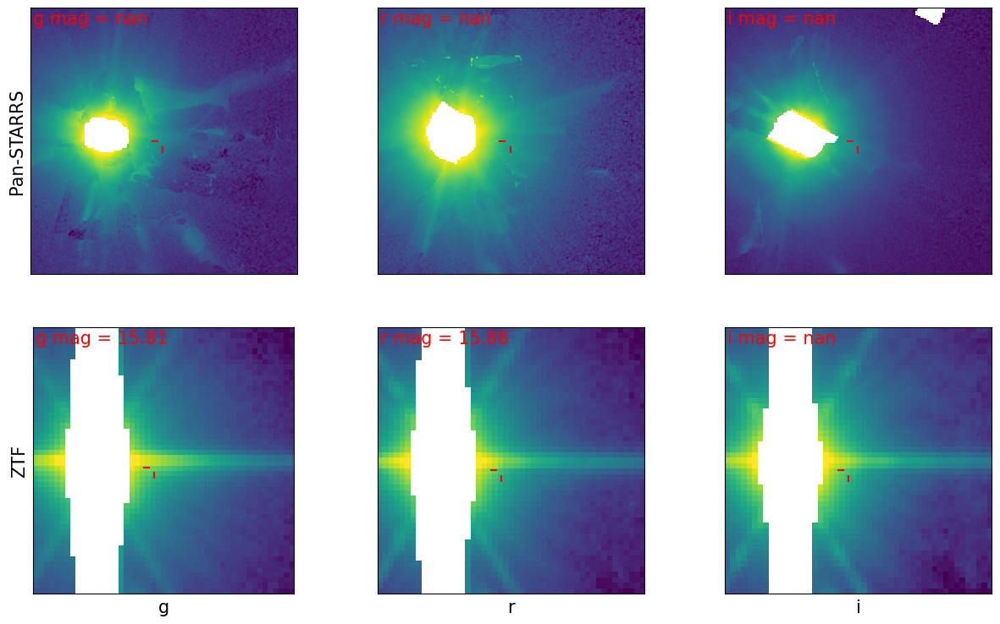

<SkyCoord (ICRS): (ra, dec) in deg
    (31.90283524, 8.84628809)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>31.458390788406362+AND+ra<32.34727968840636+AND+dec>8.401843644666718+AND+dec<9.290732544666719+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>31.458390788406362+AND+ra<32.34727968840636+AND+dec>8.401843644666718+AND+dec<9.290732544666719+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>31.458390788406362+AND+ra<32.34727968840636+AND+dec>8.401843644666718+AND+dec<9.290732544666719+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp5i0okwuv/ztf_000503_zg_c01_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp5i0okwuv/ztf_000503_zr_c01_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k

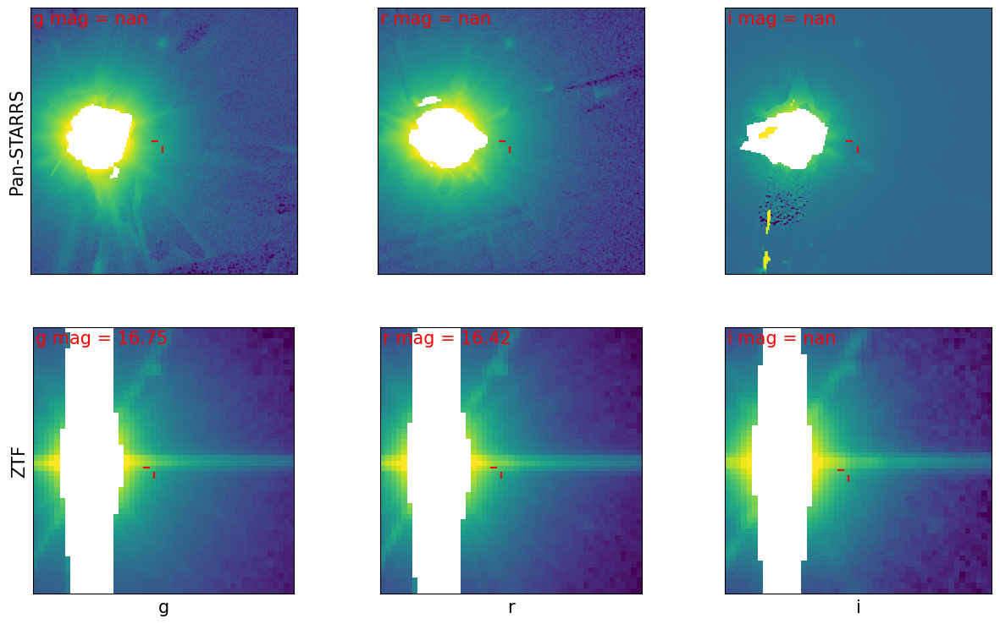

<SkyCoord (ICRS): (ra, dec) in deg
    (31.90999159, 8.84582055)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>31.465547139562226+AND+ra<32.35443603956222+AND+dec>8.401376100799197+AND+dec<9.290265000799199+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>31.465547139562226+AND+ra<32.35443603956222+AND+dec>8.401376100799197+AND+dec<9.290265000799199+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>31.465547139562226+AND+ra<32.35443603956222+AND+dec>8.401376100799197+AND+dec<9.290265000799199+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpjq460buh/ztf_000503_zg_c01_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpjq460buh/ztf_000503_zr_c01_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k

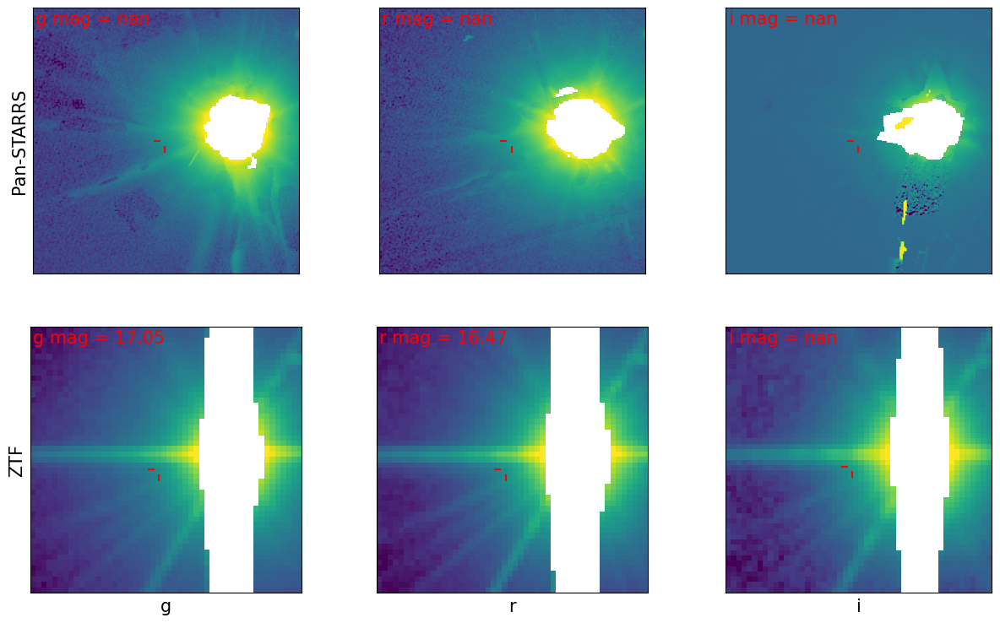

In [13]:
for src in srcs_ztf[:10]:
    print(src.coord)
    # try:
    #     axes = src.plot_all_cutouts()
    # except:
    #     print('Encountered error, skipping...')
    axes = src.plot_all_cutouts()
    plt.show()

Detected in ZTF with a 1-3'' counterpart in Pan-STARRS

In [10]:
srcs_ztf_wide = Sources(
    ras=combined_r_wide_tabs[1]['ra'],
    decs=combined_r_wide_tabs[1]['dec'],
    field_catalogs={
        'g': combined_g_wide_tabs[1],
        'r': combined_r_wide_tabs[1],
        'i': combined_i_wide_tabs[1],
    }
)
len(srcs_ztf_wide)

8

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.47768097680851+AND+ra<90.36656987680853+AND+dec>13.046071318539868+AND+dec<13.934960218539869+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.47768097680851+AND+ra<90.36656987680853+AND+dec>13.046071318539868+AND+dec<13.934960218539869+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.47768097680851+AND+ra<90.36656987680853+AND+dec>13.046071318539868+AND+dec<13.934960218539869+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp9yorp3v5/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp9yorp3v5/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp9yorp3v5/ztf_000512_zi_c12_q1_refimg.fits
Sear

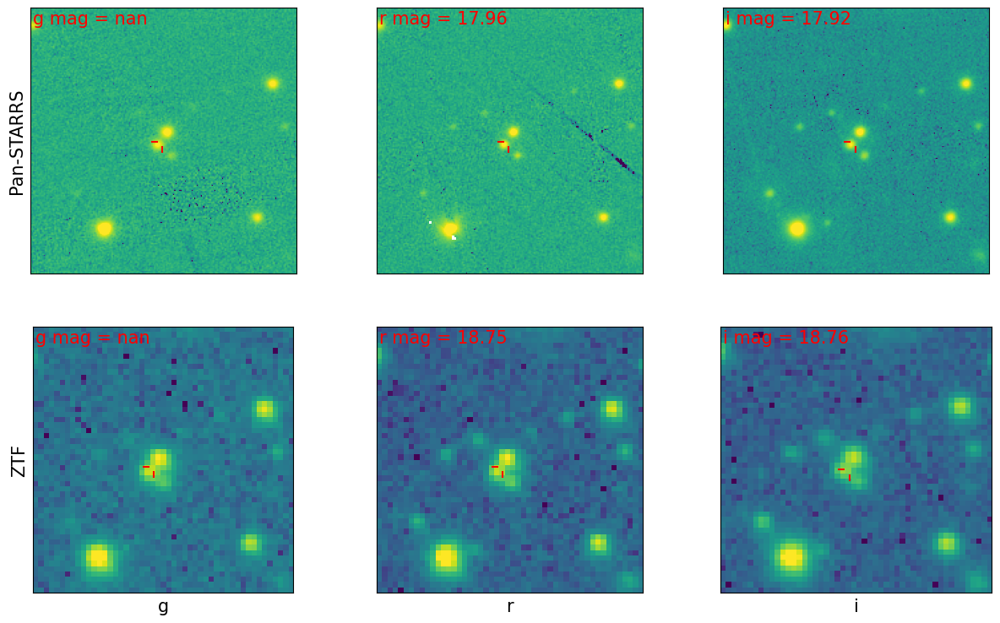

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.80948185126726+AND+ra<90.69837075126728+AND+dec>13.033896587615354+AND+dec<13.922785487615355+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.80948185126726+AND+ra<90.69837075126728+AND+dec>13.033896587615354+AND+dec<13.922785487615355+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.80948185126726+AND+ra<90.69837075126728+AND+dec>13.033896587615354+AND+dec<13.922785487615355+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpaqys8bi8/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpaqys8bi8/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpaqys8bi8/ztf_000512_zi_c12_q1_refimg.fits
Sear

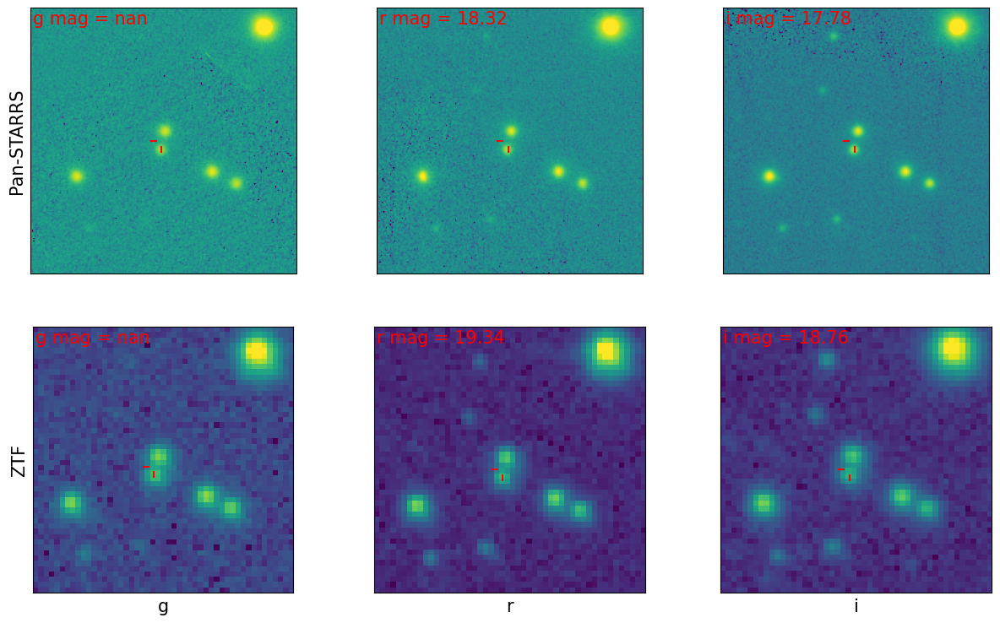

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.60824976638439+AND+ra<90.4971386663844+AND+dec>12.798717317526705+AND+dec<13.687606217526707+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.60824976638439+AND+ra<90.4971386663844+AND+dec>12.798717317526705+AND+dec<13.687606217526707+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.60824976638439+AND+ra<90.4971386663844+AND+dec>12.798717317526705+AND+dec<13.687606217526707+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpq5_3suzs/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpq5_3suzs/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpq5_3suzs/ztf_000512_zi_c12_q1_refimg.fits
Searchi

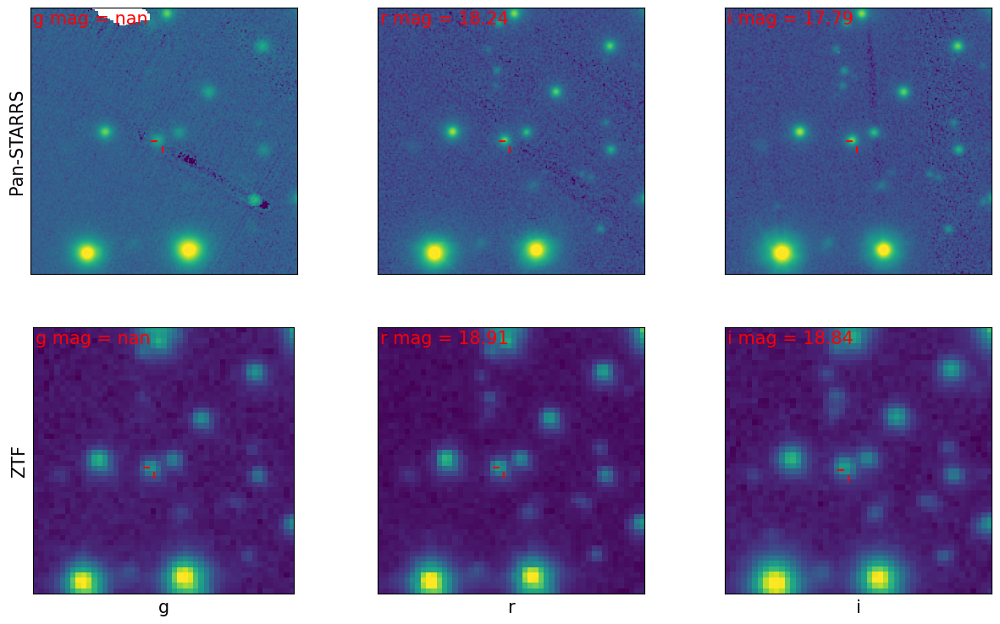

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>95.84229616736927+AND+ra<96.73118506736928+AND+dec>13.032364574085028+AND+dec<13.921253474085029+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>95.84229616736927+AND+ra<96.73118506736928+AND+dec>13.032364574085028+AND+dec<13.921253474085029+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>95.84229616736927+AND+ra<96.73118506736928+AND+dec>13.032364574085028+AND+dec<13.921253474085029+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzu2clpig/ztf_000512_zg_c09_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzu2clpig/ztf_000513_zr_c12_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzu2clpig/ztf_000513_zi_c12_q2_refimg.fits
Sear

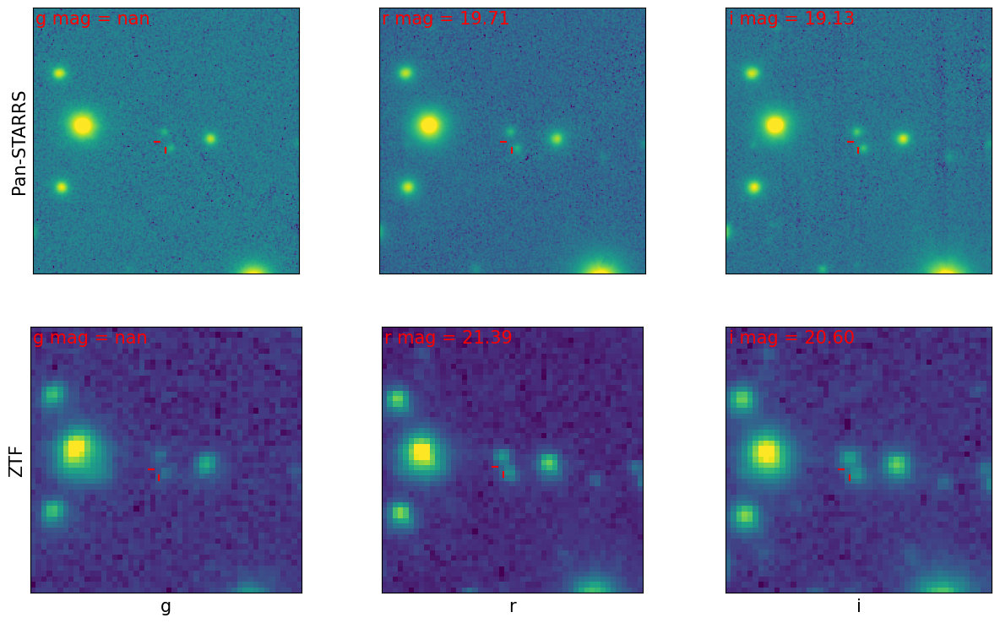

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.05975348647819+AND+ra<96.9486423864782+AND+dec>12.906846724368693+AND+dec<13.795735624368694+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.05975348647819+AND+ra<96.9486423864782+AND+dec>12.906846724368693+AND+dec<13.795735624368694+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.05975348647819+AND+ra<96.9486423864782+AND+dec>12.906846724368693+AND+dec<13.795735624368694+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpuaywzx41/ztf_000513_zg_c12_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpuaywzx41/ztf_000513_zr_c12_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpuaywzx41/ztf_000513_zi_c12_q2_refimg.fits
Searchi

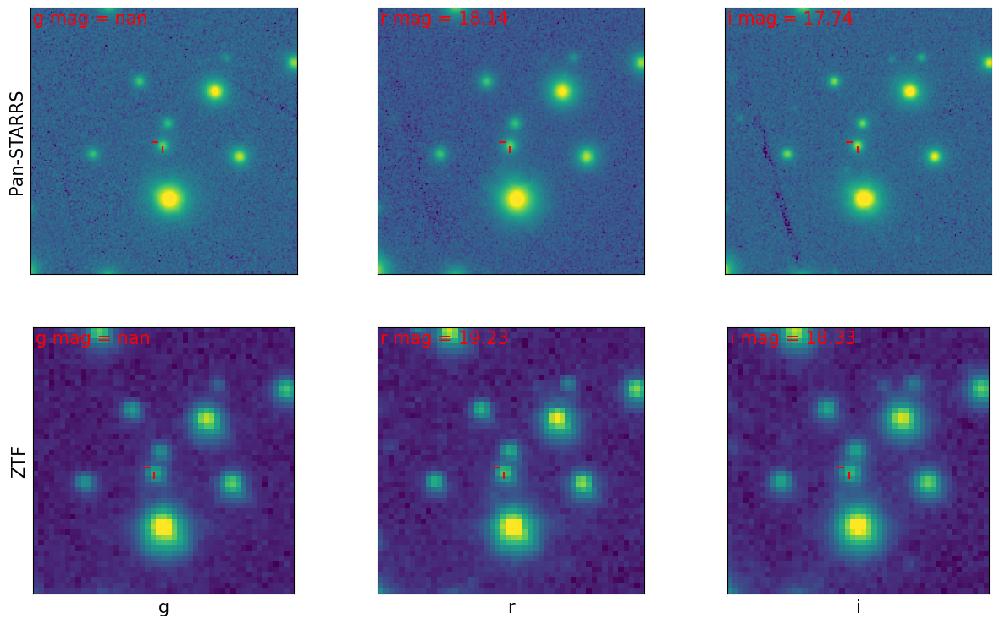

In [11]:
for src in srcs_ztf_wide[:5]:
    # try:
    axes = src.plot_all_cutouts()

    # x0, y0 = src.postage_stamps['PSTARR'].ra_dec_to_pix(src.ra, src.dec, band='g')
    # circle = plt.Circle((x0-1, y0-1), radius=12, color='red', fill=False)
    # # for i in range(axes.shape[1]):
    # axes[0][0].add_patch(circle)
    # x1, y1 = src.postage_stamps['ZTF'].ra_dec_to_pix(src.ra, src.dec, band='g')
    # circle = plt.Circle((x1-1, y1-1), radius=3, color='red', fill=False)
    # # for i in range(axes.shape[1]):
    # axes[1][0].add_patch(circle)

    # # Plot ZTF and Pan-STARR coords
    # for ax_row, func in zip(axes, [src.postage_stamps['PSTARR'].ra_dec_to_pix, src.postage_stamps['ZTF'].ra_dec_to_pix]):
    #     x_pstarr, y_pstarr = func(src.data['PSTARR_ra'], src.data['PSTARR_dec'], band='g')
    #     x_ztf, y_ztf = func(src.data['ZTF_g_ra'], src.data['ZTF_g_dec'], band='g')
    #     for ax in ax_row:
    #         ax.scatter(x_pstarr-1, y_pstarr-1, label='PSTARR', color='hotpink', marker='x')
    #         ax.scatter(x_ztf-1, y_ztf-1, label='ZTF', color='white', marker='x')

    # axes[0][-1].legend()
    # # except:
    # #     print('Encountered error, skipping...')

    plt.show()

## Detected in just Pan-STARRS

In [2]:
# Load tabs
g_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_testing/testing_stuff_g.ecsv')
r_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_testing/testing_stuff_r.ecsv')
i_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_testing/testing_stuff_i.ecsv')

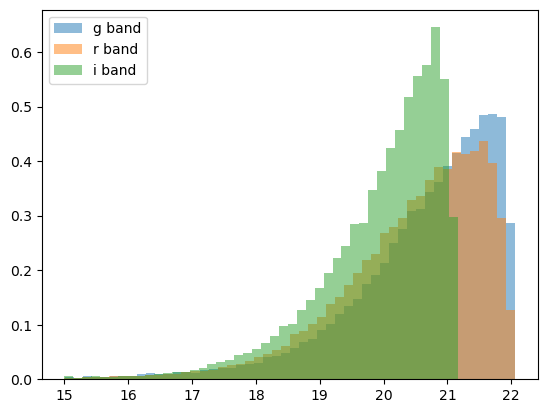

In [21]:
plt.hist(g_tab['PSTARR_gPSFMag'], density=True, alpha=0.5, bins=50, label='g band')
plt.hist(r_tab['PSTARR_rPSFMag'], density=True, alpha=0.5, bins=50, label='r band')
plt.hist(i_tab['PSTARR_iPSFMag'], density=True, alpha=0.5, bins=50, label='i band')
plt.legend()
plt.show()

In [3]:
srcs_pstarr = Sources(
    ras=g_tab['ra'],
    decs=g_tab['dec'],
    field_catalogs={
        'g': g_tab,
        'r': r_tab,
        'i': i_tab,
    },
    catch_plotting_exceptions=False,
    merged_field_basedir='/Users/adamboesky/Research/long_transients/Data/catalog_results_random_fields/field_results'
)

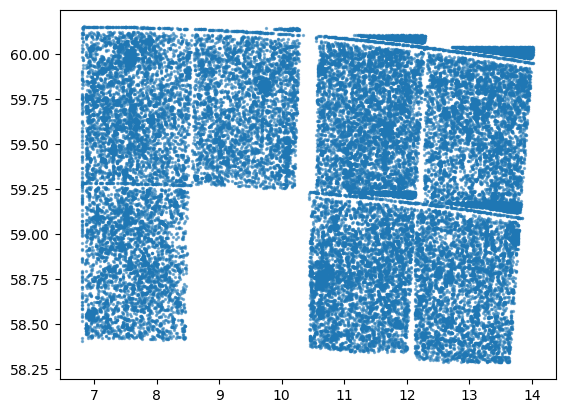

In [7]:
plt.scatter(g_tab['ra'], g_tab['dec'], s=2, alpha=0.5)
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    (12.70851055, 59.1524507)>


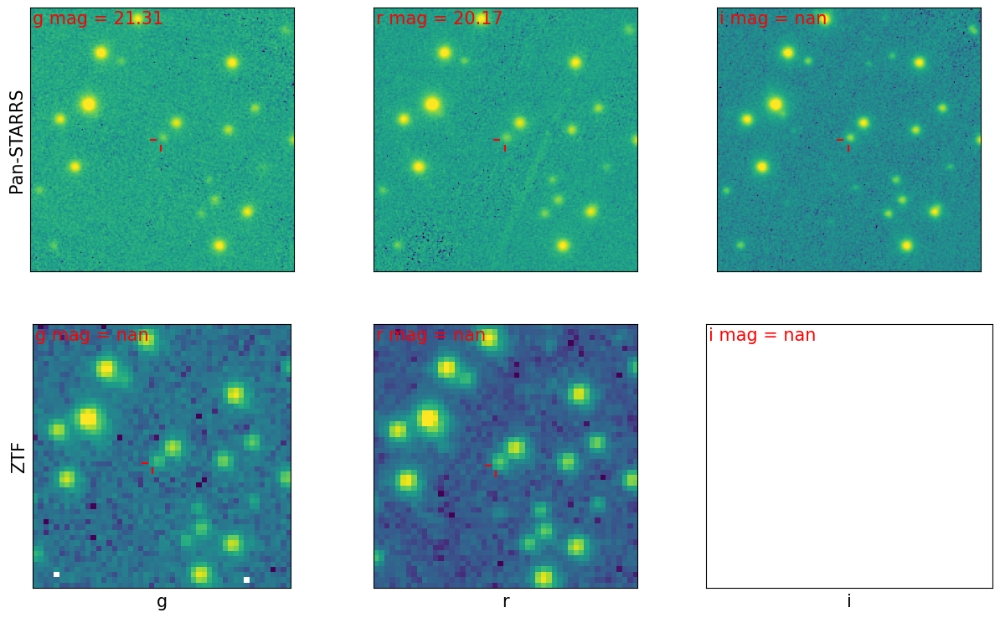

<SkyCoord (ICRS): (ra, dec) in deg
    (12.71264489, 59.15654283)>


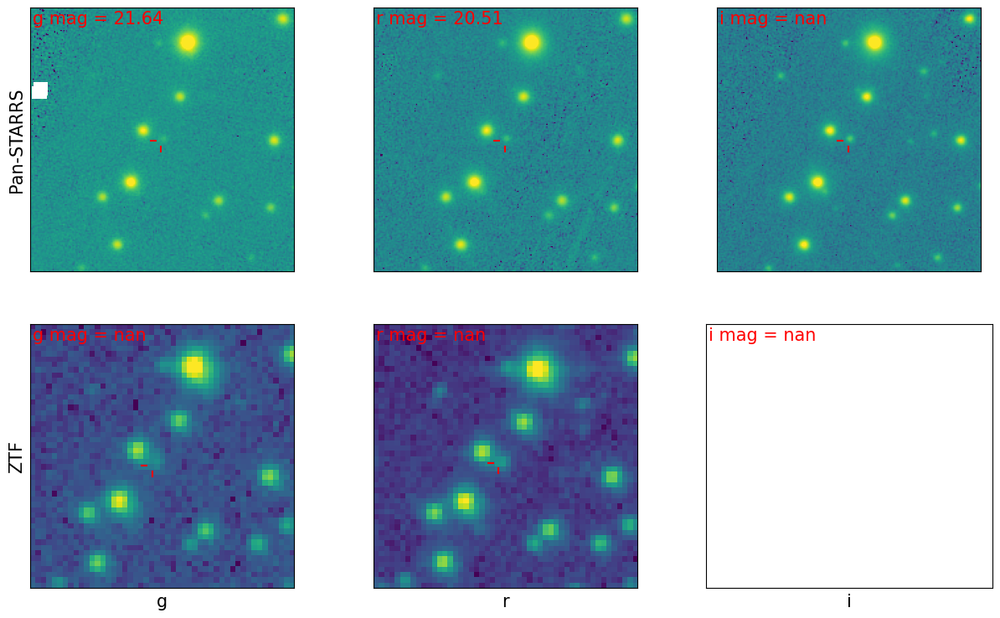

<SkyCoord (ICRS): (ra, dec) in deg
    (12.93182868, 59.1561027)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp73zogcm8/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpfnpoc5mi/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


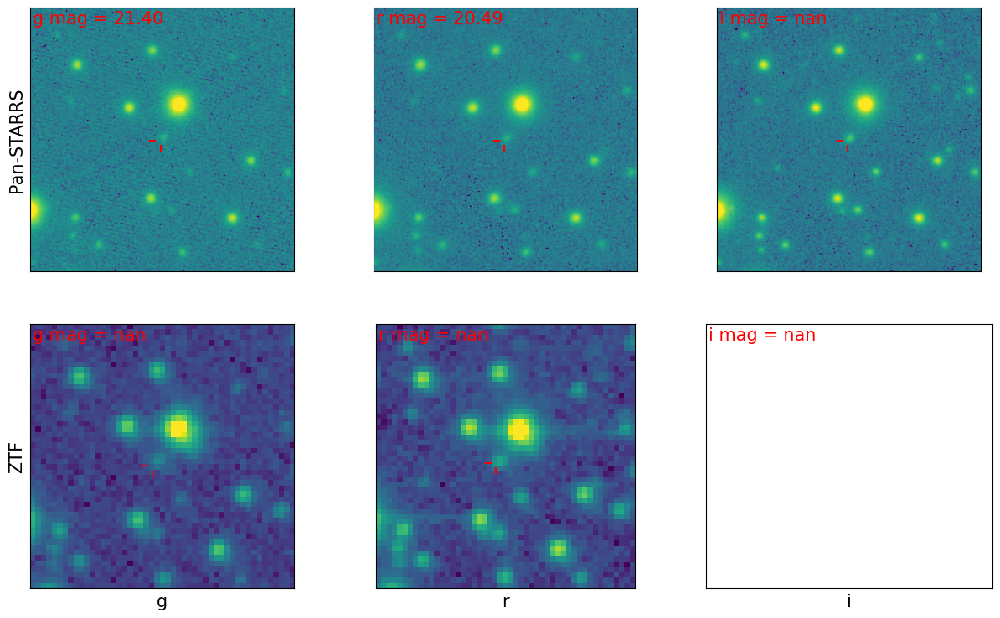

<SkyCoord (ICRS): (ra, dec) in deg
    (12.94131324, 59.15108133)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.496868791631872+AND+ra<13.385757691631873+AND+dec>58.7066368782715+AND+dec<59.5955257782715
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmphyplzy3_/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp5z72h0fj/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


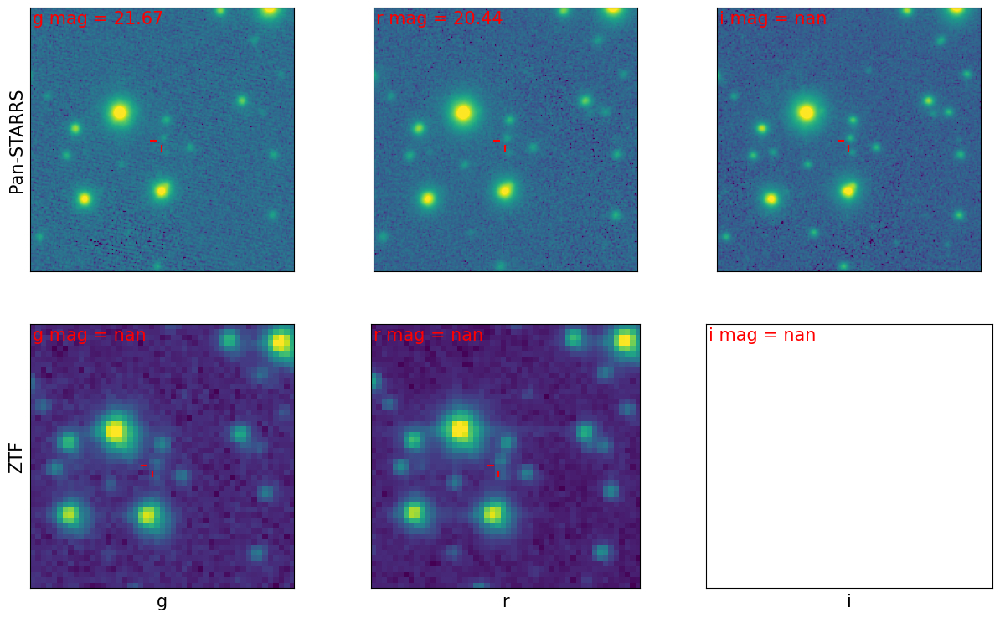

<SkyCoord (ICRS): (ra, dec) in deg
    (12.95132541, 59.15028087)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.506880960179563+AND+ra<13.395769860179565+AND+dec>58.705836422608165+AND+dec<59.59472532260816
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp3iarytij/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpkwfuvfyo/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


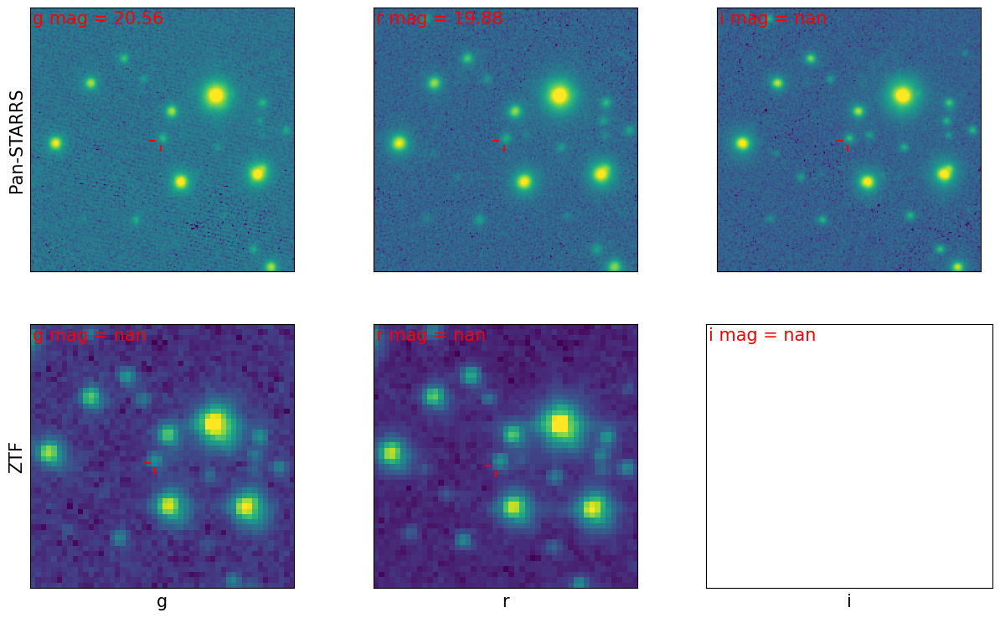

<SkyCoord (ICRS): (ra, dec) in deg
    (13.01806217, 59.15203847)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.573617722716072+AND+ra<13.462506622716074+AND+dec>58.70759402191089+AND+dec<59.59648292191089
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpi1i6rkpr/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpbn6r38x4/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


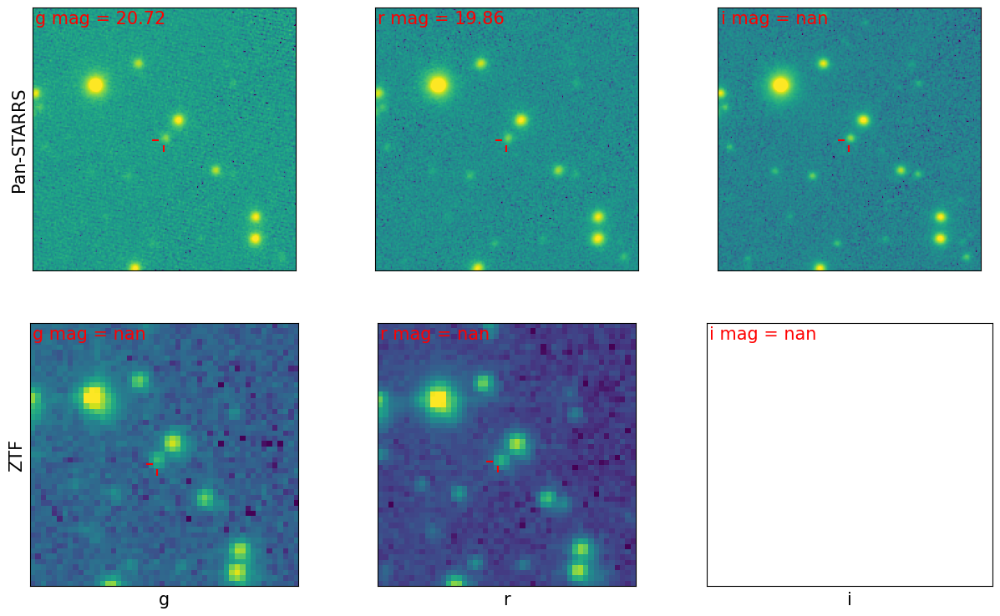

<SkyCoord (ICRS): (ra, dec) in deg
    (13.03137301, 59.15454296)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.586928560445005+AND+ra<13.475817460445006+AND+dec>58.7100985111201+AND+dec<59.5989874111201
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpq9eic6qz/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzsc87_zc/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


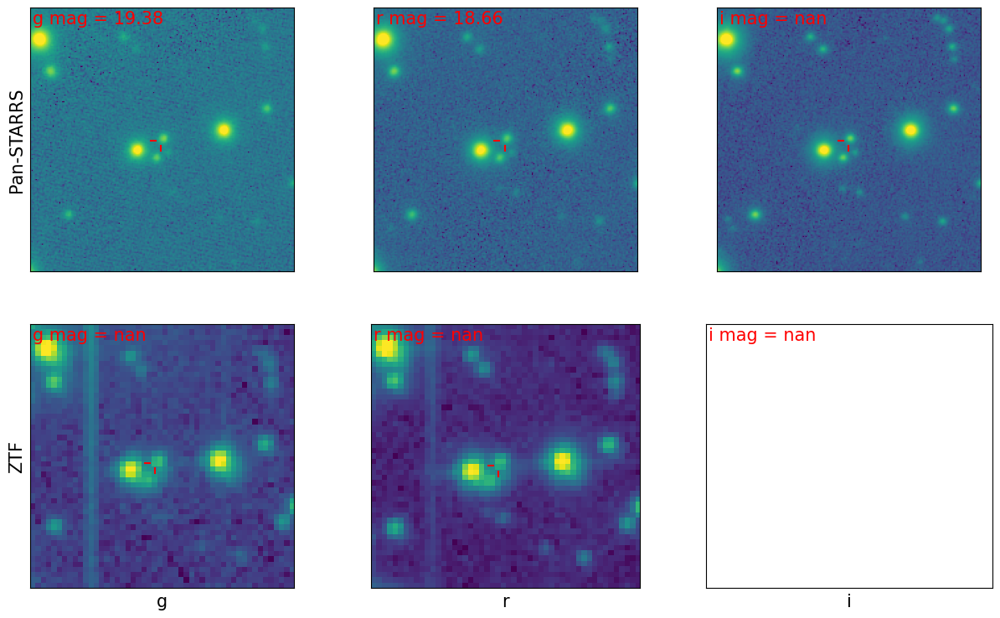

<SkyCoord (ICRS): (ra, dec) in deg
    (13.03216103, 59.15355119)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.587716578451786+AND+ra<13.476605478451788+AND+dec>58.709106735661706+AND+dec<59.597995635661704
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmplb6sycsm/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp01z_3u74/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


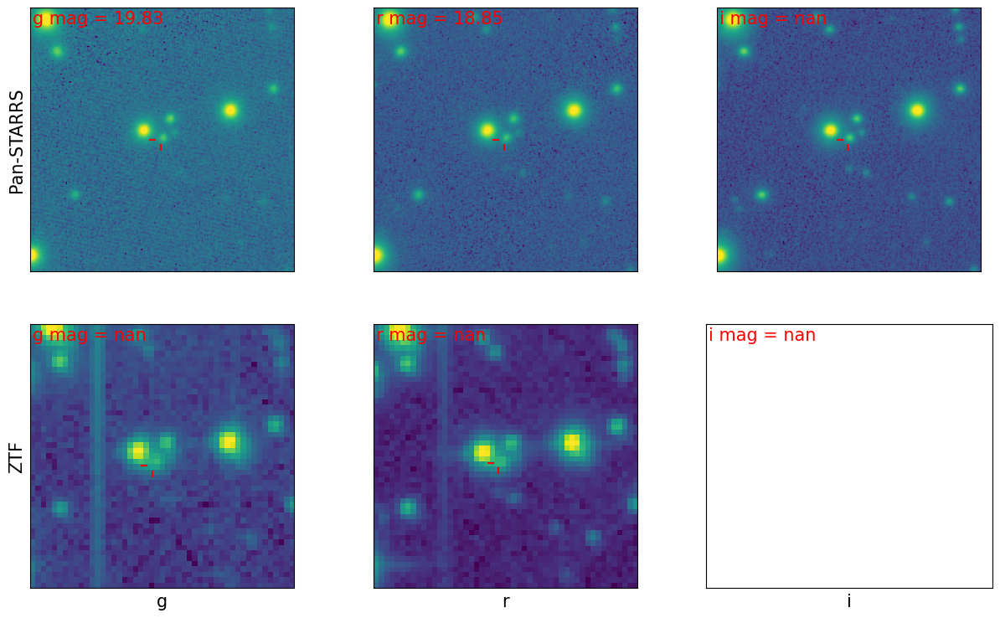

<SkyCoord (ICRS): (ra, dec) in deg
    (13.0545605, 59.15617391)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.610116051495009+AND+ra<13.49900495149501+AND+dec>58.711729459488254+AND+dec<59.60061835948825
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp7d9p6oib/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpy83n34fg/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


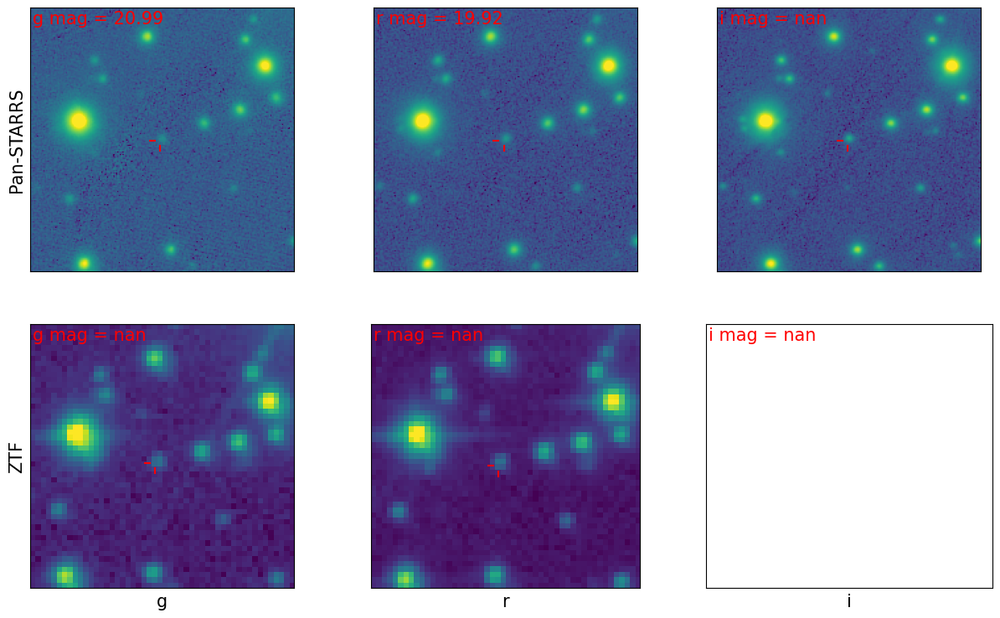

<SkyCoord (ICRS): (ra, dec) in deg
    (13.10993589, 59.15479654)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.665491441204077+AND+ra<13.554380341204078+AND+dec>58.71035208562618+AND+dec<59.599240985626174
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp_sm5nyuq/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpw66q6r67/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


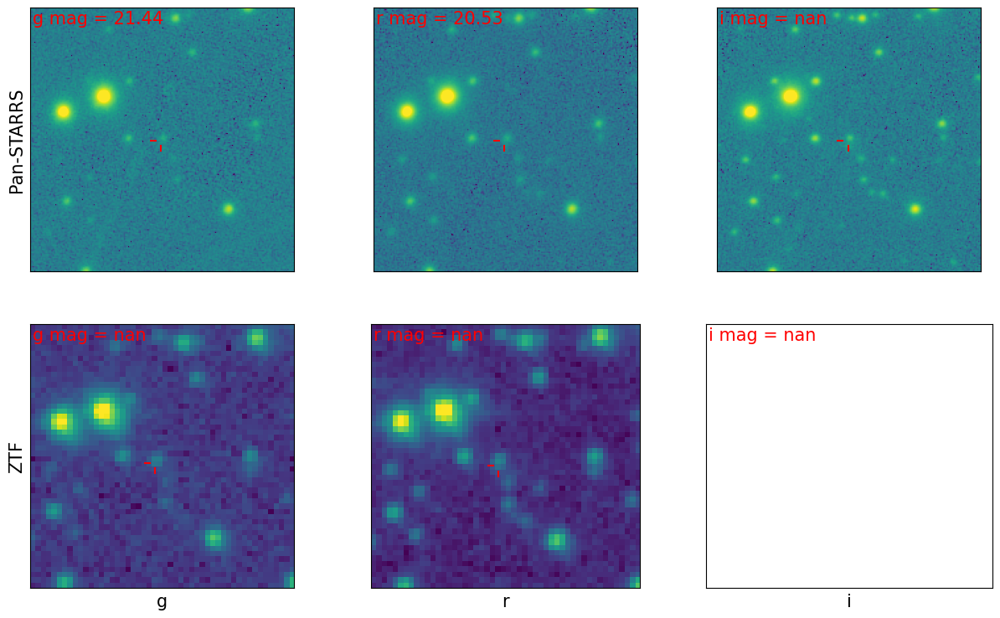

In [6]:
for src in srcs_pstarr[:10]:
    print(src.coord)
    # try:
    #     axes = src.plot_all_cutouts()
    # except:
    #     print('Encountered error, skipping...')
    axes = src.plot_all_cutouts()
    plt.show()